# Vehicle Detection

In [5]:
from pathlib import Path

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import cv2
from skimage.feature import hog

In [409]:
from sklearn.base import BaseEstimator, TransformerMixin

class ConvertColor(BaseEstimator, TransformerMixin):
    def __init__(self, colorspace='RGB'):
        self.colorspace = colorspace
        
    def fit(self, X, y=None):
        return self # nothing else to do
    
    def transform(self, X, y=None):
        if self.colorspace == 'RGB':
            return X
        else:
            cstring = 'RGB2%s' % self.colorspace
            
        converted = list()
        for i in range(X.shape[0]):
            converted.append(self.convert_color(X[i], cstring))
            
        return np.array(converted)

    @staticmethod
    def convert_color(img, conv):
        if conv == 'RGB2YCrCb':
            return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
        elif conv == 'RGB2LUV':
            return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif conv == 'BGR2RGB':
            return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        elif conv == 'RGB2YUV':
            return cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif conv == 'RGB2HLS':
            return cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif conv == 'RGB2GRAY':
            return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        else:
            raise Exception('invalid conv string')
            
class ExtractHOGFeatures(BaseEstimator, TransformerMixin):
    """This class extracts HOG features."""
    def __init__(self, orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0):
        self.orient = orient
        self.pix_per_cell = pix_per_cell
        self.cell_per_block = cell_per_block
        self.hog_channel = hog_channel
        
    def fit(self, X, y=None):
        return self # nothing else to do
    
    def transform(self, X, y=None):
        hog_features = list()
        for i in range(X.shape[0]):
        
            if hog_channel == 'ALL':
                X_i_hog_features = []
                for channel in range(feature_image.shape[2]):
                    X_i_hog_features.append(self.get_hog_features(X[i,:,:,self.hog_channel], 
                        self.orient, self.pix_per_cell, self.cell_per_block,                                      
                        vis=False, feature_vec=True))
                X_i_hog_features = np.ravel(X_i_hog_features)        
            else:
                X_i_hog_features = self.get_hog_features(X[i,:,:,self.hog_channel],
                    self.orient, self.pix_per_cell, self.cell_per_block,
                    vis=False, feature_vec=True)
                
            hog_features.append(X_i_hog_features)
            
        return np.array(hog_features)
    
    @staticmethod
    def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                            vis=False, feature_vec=True):
        # Call with two outputs if vis==True
        if vis == True:
            features, hog_image = hog(img, orientations=orient, 
                                      pixels_per_cell=(pix_per_cell, pix_per_cell),
                                      cells_per_block=(cell_per_block, cell_per_block), 
                                      transform_sqrt=False, block_norm='L2-Hys',
                                      visualise=vis, feature_vector=feature_vec)
            return features, hog_image
        # Otherwise call with one output
        else:      
            features = hog(img, orientations=orient, 
                           pixels_per_cell=(pix_per_cell, pix_per_cell),
                           cells_per_block=(cell_per_block, cell_per_block), 
                           transform_sqrt=False, block_norm='L2-Hys',
                           visualise=vis, feature_vector=feature_vec)
            return features

class ExtractPixelFeatures(BaseEstimator, TransformerMixin):
    """This class extracts pixel features by resizing input image to specified size."""
    def __init__(self, size=(32, 32)):
        self.size = size
        
    def fit(self, X, y=None):
        return self # nothing else to do
    
    def transform(self, X, y=None):
        converted = list()
        for i in range(X.shape[0]):
            converted.append(self.bin_spatial(X[i], self.size))
            
        return np.array(converted)
        
    @staticmethod
    def bin_spatial(img, size=(32, 32)):
        color1 = cv2.resize(img[:,:,0], size).ravel()
        color2 = cv2.resize(img[:,:,1], size).ravel()
        color3 = cv2.resize(img[:,:,2], size).ravel()
        return np.hstack((color1, color2, color3))

## Feature Extraction

In [30]:
data_dir = Path('data')

cars = list(data_dir.glob('vehicles/*/*.png'))
notcars = list(data_dir.glob('non-vehicles/*/*.png'))

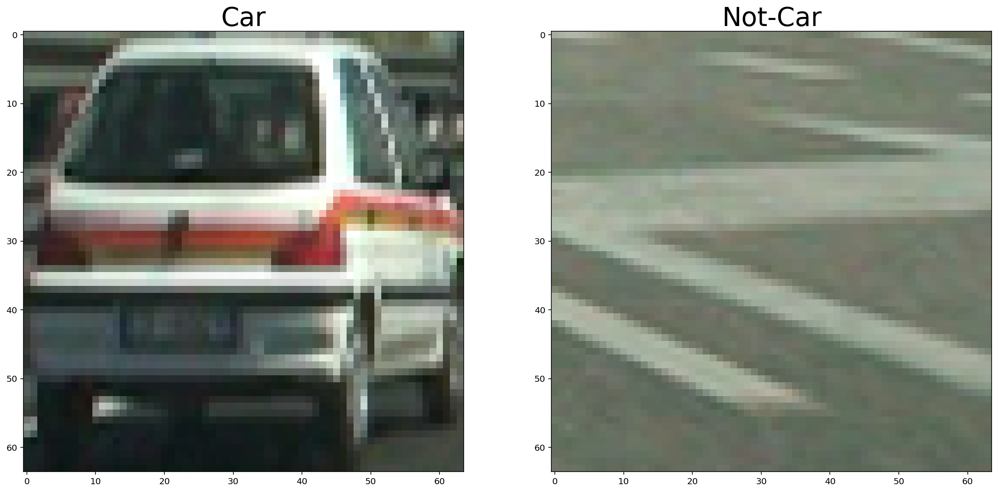

In [131]:
# example_car = convert_color(cv2.imread(str(cars[np.random.randint(0, len(cars))])), 'BGR2RGB')
example_car = np.uint8(plt.imread(str(cars[np.random.randint(0, len(cars))])) * 255)
example_notcar = np.uint8(plt.imread(str(notcars[np.random.randint(0, len(notcars))])) * 255)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10));
ax1.imshow(example_car);
ax1.set_title('Car', size=30);
ax2.imshow(example_notcar);
ax2.set_title('Not-Car', size=30);

/Users/aramos/venvs/venv3/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


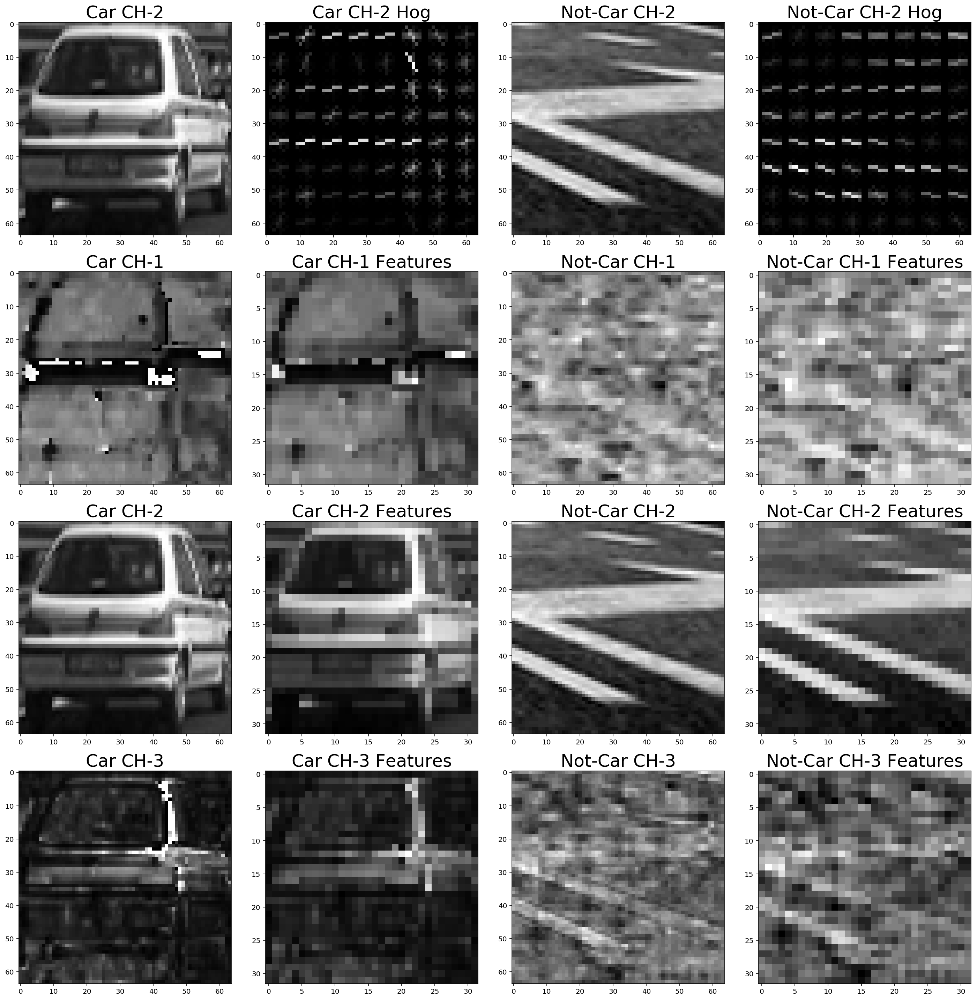

In [326]:
colorspace = 'HLS'
hog_channel = 1 # L channel in HLS space

hog_orient = 9
hog_pix_per_cell = 8
hog_cell_per_block = 2

cstring = 'RGB2%s' % colorspace

example_car_hls = ConvertColor.convert_color(example_car, cstring)
example_notcar_hls = ConvertColor.convert_color(example_notcar, cstring)

car_hog_feats, car_hog_img = ExtractHOGFeatures.get_hog_features(example_car_hls[:, :, hog_channel], 
    hog_orient, hog_pix_per_cell, hog_cell_per_block, vis=True)
notcar_hog_feats, notcar_hog_img = ExtractHOGFeatures.get_hog_features(example_notcar_hls[:, :, hog_channel],
    hog_orient, hog_pix_per_cell, hog_cell_per_block, vis=True)

car_bins = ExtractPixelFeatures.bin_spatial(example_car_hls)
notcar_bins = ExtractPixelFeatures.bin_spatial(example_notcar_hls)

f, axs = plt.subplots(4, 4, figsize=(20, 20));
axs = axs.ravel()

axs[0].imshow(example_car_hls[:,:,hog_channel], cmap='gray')
axs[0].set_title('Car CH-%d' % (hog_channel+1,), size=25);
axs[1].imshow(car_hog_img, cmap='gray');
axs[1].set_title('Car CH-%d Hog' % (hog_channel+1,), size=25);

axs[2].imshow(example_notcar_hls[:,:,hog_channel], cmap='gray')
axs[2].set_title('Not-Car CH-%d' % (hog_channel+1,), size=25);
axs[3].imshow(notcar_hog_img, cmap='gray');
axs[3].set_title('Not-Car CH-%d Hog' % (hog_channel+1,), size=25);

axs[4].imshow(example_car_hls[:,:,0], cmap='gray');
axs[4].set_title('Car CH-1', size=25);
axs[5].imshow(car_bins[:int((len(car_bins) / 3 * 1))].reshape(32, 32), cmap='gray');
axs[5].set_title('Car CH-1 Features', size=25);

axs[6].imshow(example_notcar_hls[:,:,0], cmap='gray');
axs[6].set_title('Not-Car CH-1', size=25);
axs[7].imshow(notcar_bins[:int((len(notcar_bins) / 3 * 1))].reshape(32, 32), cmap='gray');
axs[7].set_title('Not-Car CH-1 Features', size=25);

axs[8].imshow(example_car_hls[:,:,1], cmap='gray');
axs[8].set_title('Car CH-2', size=25);
axs[9].imshow(car_bins[int((len(car_bins) / 3 * 1)):int((len(car_bins) / 3 * 2))].reshape(32, 32), cmap='gray');
axs[9].set_title('Car CH-2 Features', size=25);

axs[10].imshow(example_notcar_hls[:,:,1], cmap='gray');
axs[10].set_title('Not-Car CH-2', size=25);
axs[11].imshow(notcar_bins[int((len(notcar_bins) / 3 * 1)):int((len(notcar_bins) / 3 * 2))].reshape(32, 32), cmap='gray');
axs[11].set_title('Not-Car CH-2 Features', size=25);

axs[12].imshow(example_car_hls[:,:,2], cmap='gray');
axs[12].set_title('Car CH-3', size=25);
axs[13].imshow(car_bins[int((len(car_bins) / 3 * 2)):int((len(car_bins) / 3 * 3))].reshape(32, 32), cmap='gray');
axs[13].set_title('Car CH-3 Features', size=25);

axs[14].imshow(example_notcar_hls[:,:,2], cmap='gray');
axs[14].set_title('Not-Car CH-3', size=25);
axs[15].imshow(notcar_bins[int((len(notcar_bins) / 3 * 2)):int((len(notcar_bins) / 3 * 3))].reshape(32, 32), cmap='gray');
axs[15].set_title('Not-Car CH-3 Features', size=25);

f.tight_layout();

## Load and Preprocess Data

In [361]:
# load data
X_cars = [np.uint8(plt.imread(str(p)) * 255) for p in cars]
X_notcars = [np.uint8(plt.imread(str(p)) * 255) for p in notcars]
y_cars = np.ones(len(X_cars))
y_notcars = np.zeros(len(X_notcars))

X = np.vstack([X_cars, X_notcars])
y = np.uint8(np.concatenate([y_cars, y_notcars]))

In [368]:
# shuffle and split into train and test datasets
from sklearn.model_selection import StratifiedShuffleSplit

# split samples into train and validation set
# use StratifiedShuffleSplit to ensure both sets have same proportions of car imgs
split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in split.split(X, y):
        X_train, y_train = X[train_index], y[train_index]
        X_test, y_test = X[test_index], y[test_index]

In [410]:
# extract features
# normalize features

from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.preprocessing import StandardScaler

pipline = Pipeline([
    ('color_converter', ConvertColor('HLS')),
    ('union', FeatureUnion(transformer_list=[
        ('hog_extractor', ExtractHOGFeatures(hog_channel=1)),
        ('pixel_extractor', ExtractPixelFeatures()),
    ])),
    ('std_scaler', StandardScaler()),
#     ('svc', SVC()),
])

In [411]:
%time X_train_scaled = pipline.fit_transform(X_train)

CPU times: user 45.2 s, sys: 1.15 s, total: 46.4 s
Wall time: 46.4 s


In [543]:
X_train_scaled.shape

(14208, 4836)

## Train Car Classifier

In [412]:
from sklearn.model_selection import GridSearchCV

# param_grid = [
#     {'svc__kernel': ['linear', 'rbf'], 'svc__C': [1, 10]},
# ]
param_grid = {'kernel': ['linear', 'rbf'], 'C': [0.1, 1, 10]}
svc = SVC()

clf = GridSearchCV(svc, param_grid, cv=3, n_jobs=-1, verbose=1)
%time clf.fit(X_train_scaled, y_train)

Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=-1)]: Done  18 out of  18 | elapsed: 23.1min finished


CPU times: user 2min 57s, sys: 1.57 s, total: 2min 59s
Wall time: 25min 43s


GridSearchCV(cv=3, error_score='raise',
       estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape=None, degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False),
       fit_params={}, iid=True, n_jobs=-1,
       param_grid={'kernel': ['linear', 'rbf'], 'C': [0.1, 1, 10]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring=None, verbose=1)

In [413]:
clf.best_params_

{'C': 10, 'kernel': 'rbf'}

In [414]:
clf.cv_results_

{'mean_fit_time': array([ 215.25664353,  404.75774431,  219.57805212,  260.11107373,
         201.61985826,  216.49430497]),
 'mean_score_time': array([  86.82032379,  186.02400231,   86.43546422,  124.7770443 ,
          63.40454332,   76.21413604]),
 'mean_test_score': array([ 0.95368806,  0.96649775,  0.95368806,  0.98733108,  0.95368806,
         0.99070946]),
 'mean_train_score': array([ 1.        ,  0.97100232,  1.        ,  0.99609376,  1.        ,  1.        ]),
 'param_C': masked_array(data = [0.1 0.1 1 1 10 10],
              mask = [False False False False False False],
        fill_value = ?),
 'param_kernel': masked_array(data = ['linear' 'rbf' 'linear' 'rbf' 'linear' 'rbf'],
              mask = [False False False False False False],
        fill_value = ?),
 'params': ({'C': 0.1, 'kernel': 'linear'},
  {'C': 0.1, 'kernel': 'rbf'},
  {'C': 1, 'kernel': 'linear'},
  {'C': 1, 'kernel': 'rbf'},
  {'C': 10, 'kernel': 'linear'},
  {'C': 10, 'kernel': 'rbf'}),
 'rank_test_score

In [415]:
clf.best_score_

0.99070945945945943

In [416]:
X_test_scaled = pipline.transform(X_test)
%time y_pred = clf.predict(X_test_scaled)

CPU times: user 44.4 s, sys: 168 ms, total: 44.5 s
Wall time: 44.6 s


In [418]:
# Final accuracy score
accuracy_score(y_test, y_pred)

0.99042792792792789

In [423]:
# save model
import pickle

pickle.dump({'clf': clf, 'pipeline': pipline}, open('svc_clf.pickle', 'wb'))

## Sliding Window Search

In [574]:
def predict_cars(img, pipeline, clf, ystart=400, ystop=656, scale=1.5):
    pipeline_params = pipeline.steps[1][1].get_params()
    orient = pipeline_params['hog_extactor__orient']
    pix_per_cell = pipeline_params['hog_extactor__pix_per_cell']
    cell_per_block = pipeline_params['hog_extactor__cell_per_block']
    spatial_size = pipeline_params['pixel_extactor__size']
    hog_channel = pipeline_params['hog_extactor__hog_channel']
    X_scaler = pipeline.steps[2][1]
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = pipeline.steps[0][1].transform(img_tosearch.reshape(1, *img_tosearch.shape))
    ctrans_tosearch = ctrans_tosearch.reshape(ctrans_tosearch.shape[1:])

    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))

    ch1 = ctrans_tosearch[:,:,hog_channel]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2

    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step

    # Compute individual channel HOG features for the entire image
    hog1 = ExtractHOGFeatures.get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)

    # list of bounding box coords
    predictions = list()

    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_features = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))

            # Get image patch pixel features
            spatial_features = ExtractPixelFeatures.bin_spatial(subimg, size=spatial_size)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((hog_features, spatial_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = clf.predict(test_features)

            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                pred_window = ((xbox_left, ytop_draw+ystart), (xbox_left+win_draw, ytop_draw+win_draw+ystart))
                predictions.append(pred_window)
                
    return predictions


In [594]:
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick);
    # Return the image copy with boxes drawn
    return imcopy

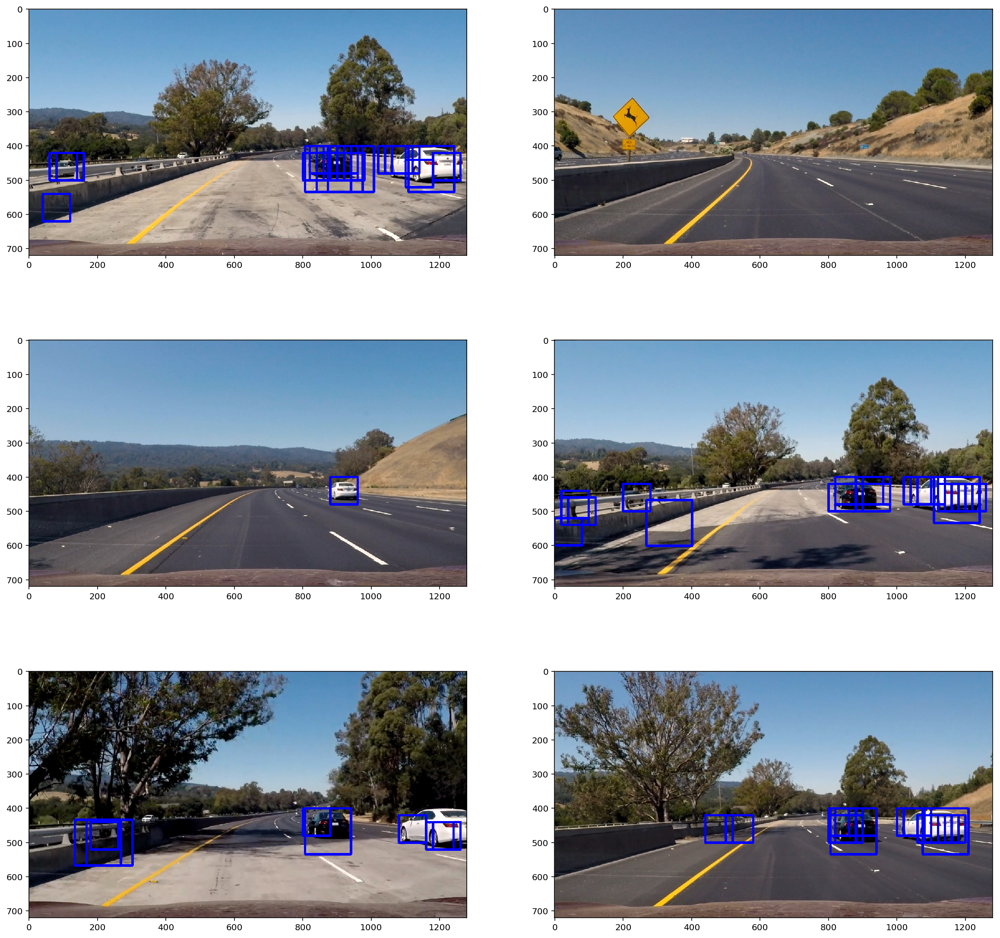

In [601]:
f, axs = plt.subplots(3, 2, figsize=(20, 20));
axs = axs.ravel()
for i in range(0, 6):
    img_path = 'test_images/test%d.jpg' % (i + 1,)
    test_img = plt.imread(img_path)
    predictions = predict_cars(test_img, pipline, clf, scale=1.25)
#     predictions.extend(predict_cars(test_img, pipline, clf, scale=1.5))
    predictions.extend(predict_cars(test_img, pipline, clf, scale=2.1))
    draw_img = draw_boxes(test_img, predictions);
    _ = axs[i].imshow(draw_img);

## Video Implementation

In [609]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

input_clip = VideoFileClip('test_video.mp4')
test_video_imgs = input_clip.write_images_sequence('test_video_imgs/frame%03d.png')

[MoviePy] Writing frames test_video_imgs/frame%03d.png.

38it [01:38,  2.64s/it]                      

[MoviePy]: Done writing frames test_video_imgs/frame%03d.png.



In [640]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

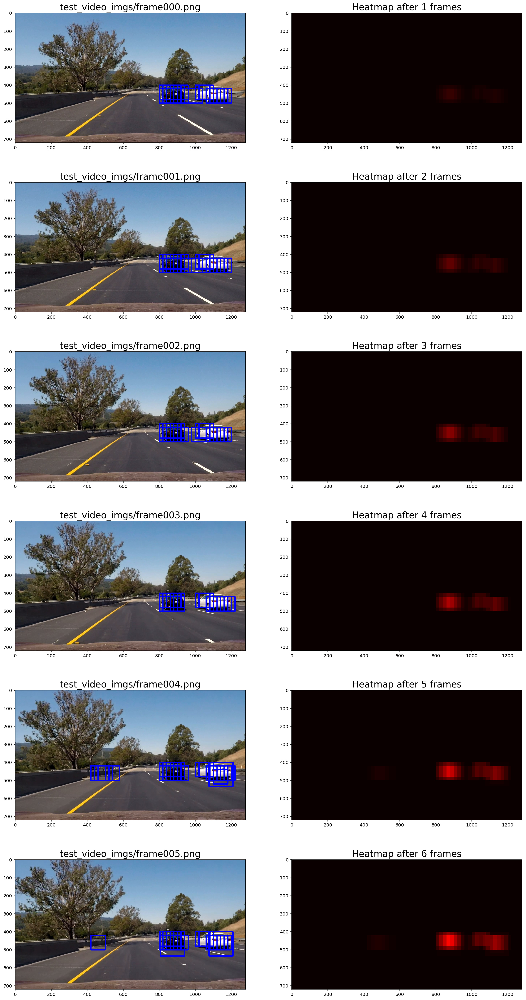

In [644]:
heat = np.zeros((720, 1280)).astype(np.float)

f, axs = plt.subplots(6, 2, figsize=(20,40))
for i in range(6):
    img_path = test_video_imgs[i]
    img = plt.imread(img_path)
    img = np.uint8(img * 255)
    
    predictions = predict_cars(img, pipline, clf, scale=1.25)
    predictions.extend(predict_cars(img, pipline, clf, scale=2.1))
    draw_img = draw_boxes(img, predictions);
    
    heat = add_heat(heat, predictions)
    
    _ = axs[i, 0].imshow(draw_img);
    _ = axs[i, 0].set_title(img_path, size=20);
    
    _ = axs[i, 1].imshow(heat, cmap='hot', vmin=0, vmax=127);
    _ = axs[i, 1].set_title('Heatmap after %d frames' % (i + 1), size=20);


2 cars found


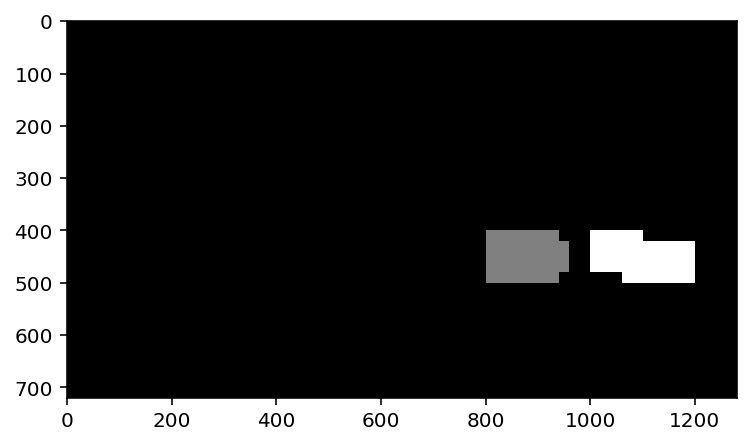

In [656]:
from scipy.ndimage.measurements import label

# Apply threshold to help remove false positives
heath_thresh = 5 
heatmap = np.clip(apply_threshold(heat, heath_thresh), 0, 255)

# Find final boxes from heatmap using label function
labels = label(heatmap)

print(labels[1], 'cars found')
plt.imshow(labels[0], cmap='gray')

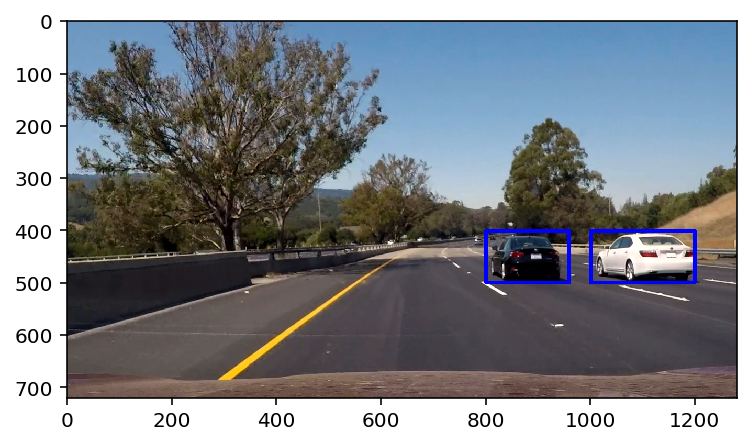

In [658]:
draw_img = draw_labeled_bboxes(np.copy(img), labels)
# Display the image
plt.imshow(draw_img)

In [673]:
from collections import deque

buffer_size = 6 # frames to consider
pred_score_thresh = 10
buffer = deque(maxlen=buffer_size)

def process_image(image):
    predictions = predict_cars(image, pipline, clf, scale=1.25)
    predictions.extend(predict_cars(image, pipline, clf, scale=2.1))

    buffer.append(predictions)
    
    heat = np.zeros((720, 1280)).astype(np.float)
    for preds in buffer:
        heat = add_heat(heat, preds)
        
    heatmap = np.clip(apply_threshold(heat, pred_score_thresh), 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)

    draw_img = draw_labeled_bboxes(np.copy(image), labels)
    return draw_img

In [674]:
processed_clip = input_clip.fl_image(process_image)
output_vid = 'test_video_output.mp4'
%time processed_clip.write_videofile(output_vid, audio=False)

[MoviePy] >>>> Building video test_video_output.mp4
[MoviePy] Writing video test_video_output.mp4


 97%|█████████▋| 38/39 [04:48<00:08,  8.07s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_output.mp4 

CPU times: user 4min 47s, sys: 1.63 s, total: 4min 48s
Wall time: 4min 49s


In [675]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_vid))